In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os

# 设置路径
now_path = os.getcwd()
data_path=now_path+'\\..\\raw data\\'

file1 = 'K562_essential_normalized_bulk_01.h5ad'

# 1. 读取数据
file_path = data_path + file1
print(f"读取数据: {file_path} ...")
adata = sc.read_h5ad(file_path)

# 2. 转为 DataFrame
# 自动判断是稀疏矩阵还是密集矩阵
if isinstance(adata.X, np.ndarray):
    data = adata.X
else:
    data = adata.X.toarray()
    
df = pd.DataFrame(data, index=adata.obs_names, columns=adata.var_names)

# 3. 筛选 线粒体相关扰动 (Rows)
# 使用关键词筛选约 200-300 个线粒体功能相关的基因干扰
keywords = ['ATP5', 'NDU', 'UQCR', 'COX', 'MRPL', 'MRPS', 'PNPT1', 'TMEM242', 'TEFM', 'POLRMT', 'TIMM', 'TOMM']
target_mask = df.index.str.contains('|'.join(keywords), case=False, regex=True)
sub = df.loc[target_mask]

# 4. 区分基因集合 (Cols)
mito_genes = [c for c in df.columns if c.startswith('MT-')]
nuc_genes  = [c for c in df.columns if not c.startswith('MT-')]

print(f"准备就绪！筛选出 {len(sub)} 个扰动样本。")
print(f"线粒体基因: {len(mito_genes)} 个, 核基因: {len(nuc_genes)} 个")

读取数据: d:\一些资料\生物\基因组学数据分析\Perturb-seq\..\raw data\K562_essential_normalized_bulk_01.h5ad ...
准备就绪！筛选出 106 个扰动样本。
线粒体基因: 0 个, 核基因: 8563 个


In [3]:
def extract_gene_name_from_index(index_str):
    """从索引字符串中提取基因名"""
    parts = index_str.split('_')
    if len(parts) >= 2:
        return parts[1]
    else:
        return index_str

sub['gene_name'] = sub.index.map(extract_gene_name_from_index)

C:\Users\李想\AppData\Local\Temp\ipykernel_18736\853591558.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub['gene_name'] = sub.index.map(extract_gene_name_from_index)


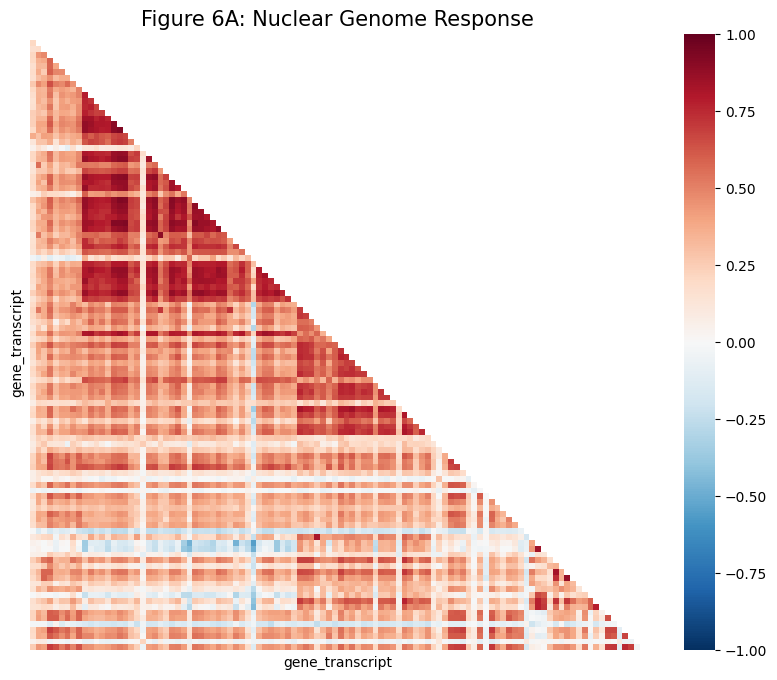

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
# 1. 挑选变异最大的前 500 个核基因
top_nuc = sub[nuc_genes].var().nlargest(500).index

# 2. 计算相关性
corr_nuc = sub[top_nuc].T.corr().fillna(0)

# 3. 生成遮罩
mask = np.triu(np.ones_like(corr_nuc, dtype=bool))

# 4. 绘图
plt.figure(figsize=(10, 8))
sns.heatmap(corr_nuc, 
            mask=mask,
            cmap='RdBu_r', 
            center=0, vmin=-1, vmax=1,
            square=True,
            xticklabels=False, yticklabels=False)

plt.title("Figure 6A: Nuclear Genome Response", fontsize=15)
plt.show()

In [5]:
# 1. 打印前 20 个列名，看看格式
print("🔍 前 20 个基因名 (Columns):")
print(df.columns[:20].tolist())

# 2. 搜索一下有没有带 'MT' 或者 'ND1' 的基因，看看它们到底叫什么
print("\n🔍 搜索包含 'ND1' 的基因名:")
found_nd1 = [c for c in df.columns if 'ND1' in str(c)]
print(found_nd1)

print("\n🔍 搜索包含 'ATP6' 的基因名:")
found_atp6 = [c for c in df.columns if 'ATP6' in str(c)]
print(found_atp6)

# 3. 检查一下 df 的形状，确保数据读进来了
print(f"\n📊 数据矩阵形状: {df.shape}")

🔍 前 20 个基因名 (Columns):
['ENSG00000237491', 'ENSG00000228794', 'ENSG00000188976', 'ENSG00000187961', 'ENSG00000188290', 'ENSG00000187608', 'ENSG00000078808', 'ENSG00000176022', 'ENSG00000160087', 'ENSG00000131584', 'ENSG00000169972', 'ENSG00000127054', 'ENSG00000107404', 'ENSG00000162576', 'ENSG00000175756', 'ENSG00000221978', 'ENSG00000224870', 'ENSG00000242485', 'ENSG00000160072', 'ENSG00000197785']

🔍 搜索包含 'ND1' 的基因名:
[]

🔍 搜索包含 'ATP6' 的基因名:
[]

📊 数据矩阵形状: (2285, 8563)


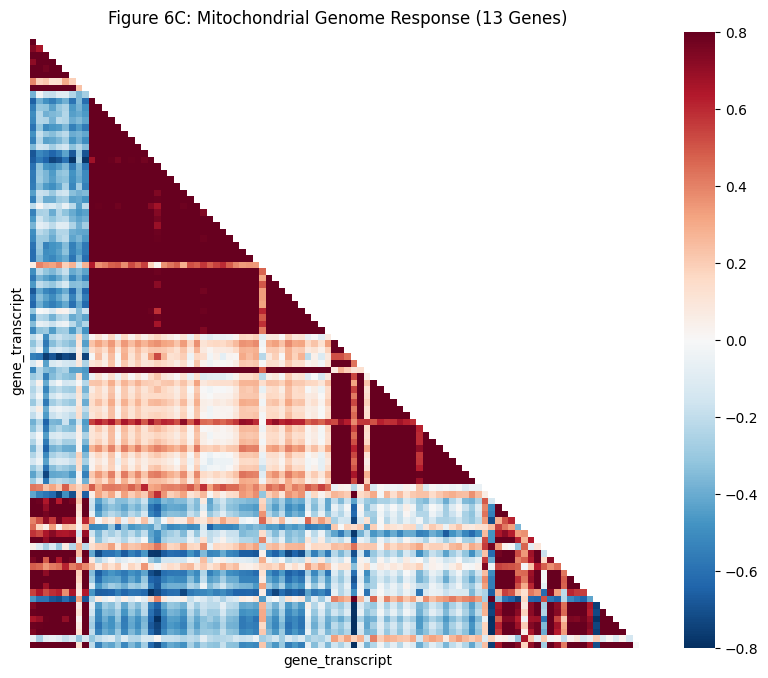

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. 人类13个线粒体基因的 Ensembl ID (直接映射，无需搜索)
mito_ids = [
    'ENSG00000198888', 'ENSG00000198763', 'ENSG00000198804', 'ENSG00000198712', # ND1, ND2, COX1, COX2
    'ENSG00000228253', 'ENSG00000198899', 'ENSG00000198938', 'ENSG00000198840', # ATP8, ATP6, COX3, ND3
    'ENSG00000212907', 'ENSG00000198886', 'ENSG00000198786', 'ENSG00000198695', 'ENSG00000198727'  # ND4L, ND4, ND5, ND6, CYB
]

# 2. 确认这些ID在你的数据里
valid_cols = [c for c in mito_ids if c in df.columns]

# 3. 筛选行 (线粒体相关扰动)
keywords = ['ATP5', 'NDU', 'UQCR', 'COX', 'MRPL', 'MRPS', 'PNPT1', 'TMEM242']
sub = df.loc[df.index.str.contains('|'.join(keywords), case=False, regex=True)]

# 如果筛选不到行(说明行名也是ID)，就取方差最大的前200行代替，保证出图
if sub.empty:
    print("提示：行名匹配失败，自动选取变异最大的前 200 行进行绘图。")
    sub = df.loc[df[valid_cols].var(axis=1).nlargest(200).index]

# 4. 绘图 (Figure 6C)
corr = sub[valid_cols].T.corr().fillna(0)
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask, cmap='RdBu_r', center=0, vmin=-0.8, vmax=0.8,
            square=True, xticklabels=False, yticklabels=False)
plt.title(f"Figure 6C: Mitochondrial Genome Response ({len(valid_cols)} Genes)")
plt.show()

In [8]:
sub

gene_id,ENSG00000237491,ENSG00000228794,ENSG00000188976,ENSG00000187961,ENSG00000188290,ENSG00000187608,ENSG00000078808,ENSG00000176022,ENSG00000160087,ENSG00000131584,...,ENSG00000212907,ENSG00000198886,ENSG00000198786,ENSG00000198695,ENSG00000198727,ENSG00000278704,ENSG00000274847,ENSG00000278384,ENSG00000271254,ENSG00000276345
gene_transcript,,,,,,,,,,,,,,,,,,,,,
1805_COX10_P1P2_ENSG00000006695,-0.073420,0.073069,-0.124542,0.036211,0.027938,0.041624,-0.131004,0.105503,-0.221017,0.098710,...,0.112710,0.411925,0.100794,-0.060449,0.283015,-0.066783,-0.070482,-0.104444,0.330023,-0.080377
1806_COX11_P1P2_ENSG00000166260,0.027096,-0.049743,-0.112952,0.013753,-0.040277,-0.058488,-0.187540,-0.147826,-0.018896,-0.077787,...,0.058366,0.488777,0.135011,-0.090717,0.244848,-0.026174,0.048996,0.007734,-0.098999,0.068642
1808_COX15_P1P2_ENSG00000014919,-0.037711,-0.116635,-0.237812,-0.110387,0.145565,0.304649,0.070355,-0.049750,-0.338905,-0.054105,...,-0.144209,0.161425,-0.010691,-0.077858,0.706632,0.122310,-0.224423,0.070019,-0.042679,-0.006730
1810_COX17_P1P2_ENSG00000138495,-0.021984,-0.114264,-0.131173,-0.051287,-0.098048,0.080700,-0.047418,0.163501,-0.060190,-0.156102,...,0.028006,0.754006,0.105576,-0.379309,0.551018,0.149266,-0.036805,-0.071383,0.056549,0.168938
1815_COX5A_P1P2_ENSG00000178741,0.092752,0.124509,-0.169119,-0.001245,-0.004251,0.113653,-0.189012,-0.148934,-0.150517,-0.005566,...,-0.384493,1.278587,-0.471932,-0.600820,1.332206,0.057608,0.149493,0.070162,0.081316,-0.255447
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9611_UQCRC1_P2_ENSG00000010256,0.088779,-0.031576,0.027927,-0.028805,0.028069,0.052809,-0.012197,-0.047190,-0.013223,-0.024179,...,-0.128665,0.118262,-0.035672,-0.113075,0.088175,-0.116978,0.178259,0.020102,0.105966,-0.020120
9612_UQCRC2_P1P2_ENSG00000140740,0.223311,0.252713,-0.189277,-0.151678,0.220538,-0.031056,-0.333468,-0.104832,-0.209270,-0.061784,...,-0.140654,1.303726,-0.838265,-0.683567,0.953809,0.043355,-0.112132,0.099440,0.057119,-0.093850
9613_UQCRFS1_P1P2_ENSG00000169021,0.123026,-0.029464,-0.170873,-0.142838,-0.070977,0.110322,0.091442,-0.101483,-0.147579,-0.027414,...,-0.035131,1.190515,-0.404617,-0.280373,1.059595,-0.091345,-0.105799,0.301751,0.294789,-0.150583


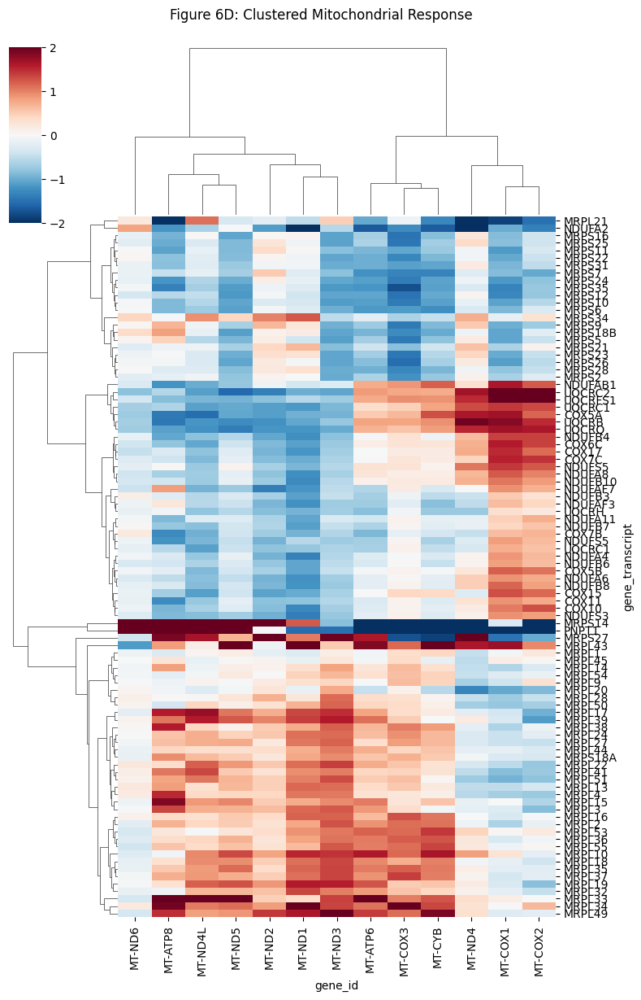

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore

# 1. 准备数据 (ID转名字)
id_map = {
    'ENSG00000198888':'MT-ND1', 'ENSG00000198763':'MT-ND2', 'ENSG00000198804':'MT-COX1', 
    'ENSG00000198712':'MT-COX2', 'ENSG00000228253':'MT-ATP8', 'ENSG00000198899':'MT-ATP6', 
    'ENSG00000198938':'MT-COX3', 'ENSG00000198840':'MT-ND3', 'ENSG00000212907':'MT-ND4L', 
    'ENSG00000198886':'MT-ND4', 'ENSG00000198786':'MT-ND5', 'ENSG00000198695':'MT-ND6', 
    'ENSG00000198727':'MT-CYB'
}

# 2. 准备绘图数据
# 注意：这里取 sub 的全部或者更多样本，让聚类算法有东西可聚
plot_df = sub[valid_cols].rename(columns=id_map)
plot_df.index = plot_df.index.map(extract_gene_name_from_index)

# 如果样本太多画不下，先按方差筛选前 100 个最有代表性的，再聚类
if len(plot_df) > 100:
    plot_df = plot_df.loc[plot_df.var(axis=1).nlargest(100).index]

# 3. Z-score 标准化
plot_df_z = plot_df.apply(zscore)

# 4. 绘图 (关键修改：使用 clustermap 而不是 heatmap)
# row_cluster=True: 自动把相似的行排在一起 -> 形成条带
# col_cluster=True: 自动把相似的线粒体基因排在一起
g = sns.clustermap(plot_df_z,
                   method='ward',       # 聚类算法
                   metric='euclidean', 
                   cmap='RdBu_r',       # 红蓝配色
                   center=0, vmin=-2, vmax=2,
                   row_cluster=True,    # ✅ 开启行聚类 (关键!)
                   col_cluster=True,    # ✅ 开启列聚类
                   figsize=(8, 12),     # 调成长方形
                   xticklabels=True, yticklabels=True) 

# 调整标题位置
g.fig.suptitle("Figure 6D: Clustered Mitochondrial Response", y=1.02)
plt.show()

读取 RPE1 数据: data/rpe1_normalized_bulk_01.h5ad
索引清洗完成。
找到 122 个候选样本，正在计算表型强度...
✅ 已筛选出表型最强的 122 个扰动。


/root/miniforge3/lib/python3.10/site-packages/numpy/_core/_methods.py:194: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


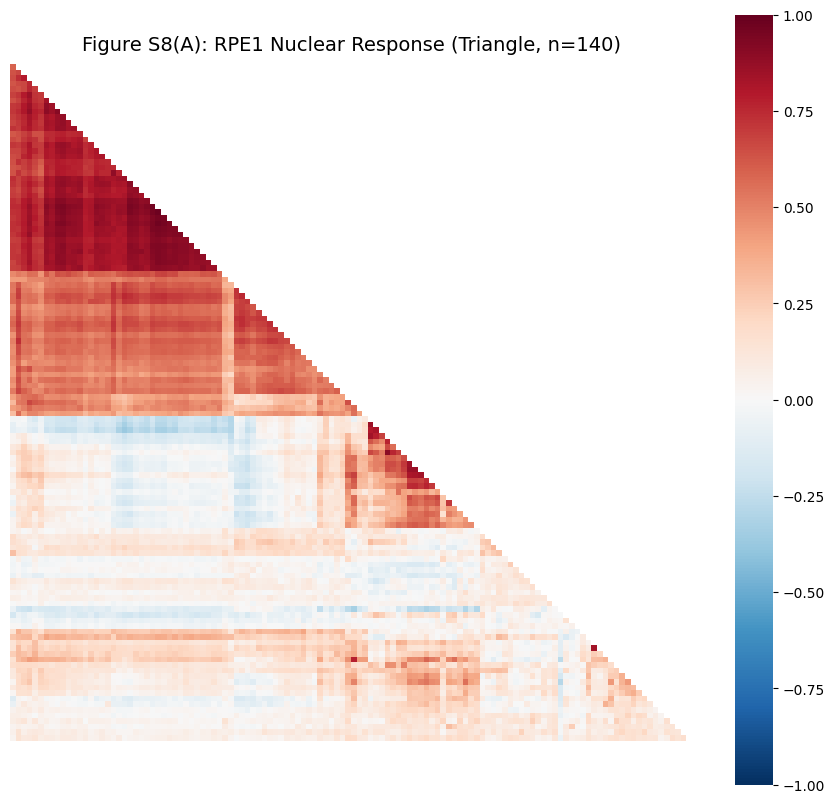

In [5]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import scipy.cluster.hierarchy as sch

# 1. 读取数据
file_path = "data/rpe1_normalized_bulk_01.h5ad"
print(f"读取 RPE1 数据: {file_path}")
adata = sc.read_h5ad(file_path)

# 2. 清洗索引 & 去重 (关键步骤)
adata.obs_names = [s.split('_')[1] if '_' in s else s for s in adata.obs_names]
adata.obs_names_make_unique() # 解决 InvalidIndexError
print("索引清洗完成。")

# 3. 筛选线粒体扰动
keywords = ['MRPL', 'MRPS', 'NDU', 'ATP5', 'COX', 'TIMM', 'TOMM', 'UQCR']
mito_candidates = [name for name in adata.obs_names if any(k in name for k in keywords)]

print(f"找到 {len(mito_candidates)} 个候选样本，正在计算表型强度...")

# =======================================================
# 4. 关键修复：安全的方差计算
# =======================================================
# 提取数据视图
sub_view = adata[mito_candidates, :].X

# 无论它是稀疏矩阵还是 ArrayView，都强制转为普通的 Numpy 数组
# 因为只取了几百行，内存完全没压力
if hasattr(sub_view, "toarray"):
    sub_data = sub_view.toarray()
else:
    sub_data = np.array(sub_view)

# 直接使用 Numpy 自带的方差函数 (axis=1 按行计算)
row_vars = sub_data.var(axis=1)

# 排序取前 140 个 (n=140)
phenotype_strength = pd.Series(row_vars, index=mito_candidates)
top_140_perturbations = phenotype_strength.nlargest(140).index.tolist()
print(f"✅ 已筛选出表型最强的 {len(top_140_perturbations)} 个扰动。")

# 5. 筛选核基因 (Cols)
# ------------------------------------------------
# 同样为了安全，计算列方差时也做一下类型检查
if hasattr(adata.X, "toarray"):
    # 稀疏矩阵手动算方差 (避免全量转稠密)
    col_mean = np.array(adata.X.mean(axis=0)).flatten()
    col_sq_mean = np.array(adata.X.multiply(adata.X).mean(axis=0)).flatten()
    col_var = col_sq_mean - col_mean**2
else:
    # 稠密矩阵直接算
    col_var = adata.X.var(axis=0)

var_series = pd.Series(col_var, index=adata.var_names)
nuc_vars = var_series[~var_series.index.str.startswith('MT-')].nlargest(1500).index

# 6. 提取数据并计算相关性
# ------------------------------------------------
subset_df = adata[top_140_perturbations, nuc_vars].to_df()
corr_matrix = subset_df.T.corr()

# 7. 聚类排序 + 三角形绘图
# ------------------------------------------------
# 计算聚类顺序
linkage = sch.linkage(corr_matrix, method='ward')
dendro = sch.dendrogram(linkage, no_plot=True)
reordered_ind = dendro['leaves']

# 重排矩阵
corr_sorted = corr_matrix.iloc[reordered_ind, reordered_ind]

# 创建三角形遮罩
mask = np.triu(np.ones_like(corr_sorted, dtype=bool))

plt.figure(figsize=(11, 10))
sns.heatmap(corr_sorted, 
            mask=mask, 
            cmap='RdBu_r', 
            center=0, vmin=-1, vmax=1,
            square=True,
            xticklabels=False, yticklabels=False)

plt.title("Figure S8(A): RPE1 Nuclear Response (Triangle, n=140)", fontsize=14)
plt.show()

✅ 通过 ID 找到了 13 个线粒体基因 (共13个)。


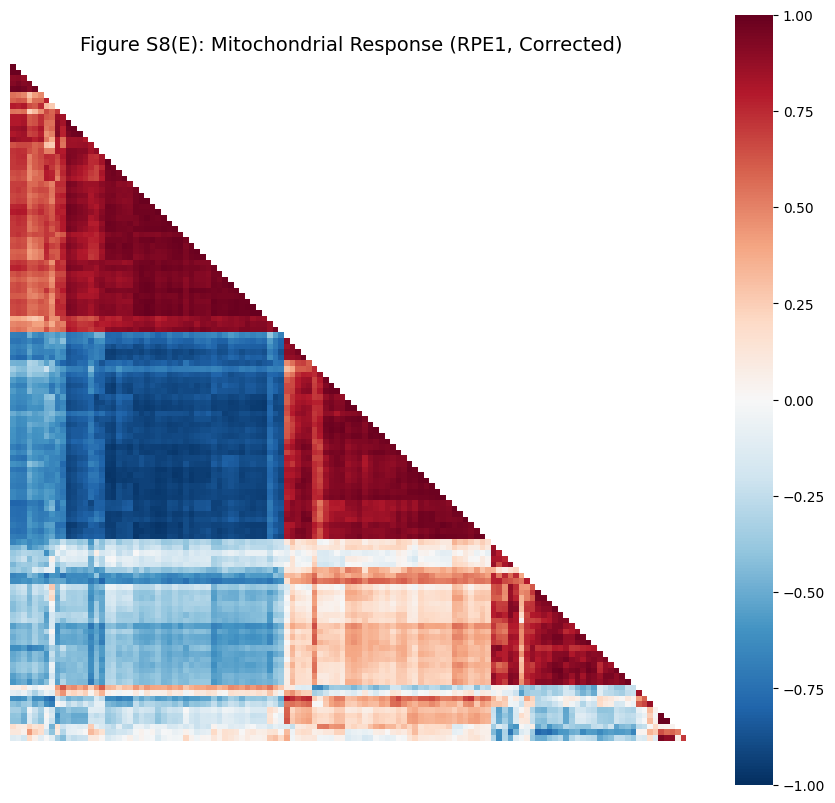

In [7]:
# 1. 定义映射字典 (Ensembl ID -> 易读的名字)
# ------------------------------------------------
id_map = {
    'ENSG00000198888':'MT-ND1', 'ENSG00000198763':'MT-ND2', 'ENSG00000198804':'MT-COX1', 
    'ENSG00000198712':'MT-COX2', 'ENSG00000228253':'MT-ATP8', 'ENSG00000198899':'MT-ATP6', 
    'ENSG00000198938':'MT-COX3', 'ENSG00000198840':'MT-ND3', 'ENSG00000212907':'MT-ND4L', 
    'ENSG00000198886':'MT-ND4', 'ENSG00000198786':'MT-ND5', 'ENSG00000198695':'MT-ND6', 
    'ENSG00000198727':'MT-CYB'
}

# 2. 在数据中查找这些 ID
# ------------------------------------------------
# 找出数据里存在的 ID
valid_ids = [ID for ID in id_map.keys() if ID in adata.var_names]

print(f"✅ 通过 ID 找到了 {len(valid_ids)} 个线粒体基因 (共13个)。")

if len(valid_ids) == 0:
    print("❌ 依然没找到！请运行 print(adata.var_names[:5]) 看看列名到底长啥样。")
else:
    # 3. 提取数据 (复用之前算好的 top_140_perturbations)
    # ------------------------------------------------
    # 提取这些列
    subset_e = adata[top_140_perturbations, valid_ids].to_df()
    
    # 把列名从 ID 改成名字 (比如 ENSG... -> MT-ND1) 方便看图
    subset_e.columns = [id_map[c] for c in subset_e.columns]

    # 4. 标准化 (Z-score)
    # ------------------------------------------------
    # 按基因(列)进行标准化
    subset_e = subset_e.apply(zscore, axis=0)
    
    # 5. 计算相关性 & 聚类排序
    # ------------------------------------------------
    corr_e = subset_e.T.corr()
    
    # 聚类
    linkage_e = sch.linkage(corr_e, method='ward')
    reordered_ind = sch.dendrogram(linkage_e, no_plot=True)['leaves']
    
    # 排序
    corr_sorted = corr_e.iloc[reordered_ind, reordered_ind]
    
    # 遮罩上三角
    mask = np.triu(np.ones_like(corr_sorted, dtype=bool))

    # 6. 绘图
    # ------------------------------------------------
    plt.figure(figsize=(11, 10))
    sns.heatmap(corr_sorted, 
                mask=mask, 
                cmap='RdBu_r', 
                center=0, vmin=-1, vmax=1,
                square=True,
                xticklabels=False, yticklabels=False)

    plt.title("Figure S8(E): Mitochondrial Response (RPE1, Corrected)", fontsize=14)
    plt.show()

S8(G): 找到 31 个样本 (含 3 个 TMEM242)。


<Figure size 1000x1000 with 0 Axes>

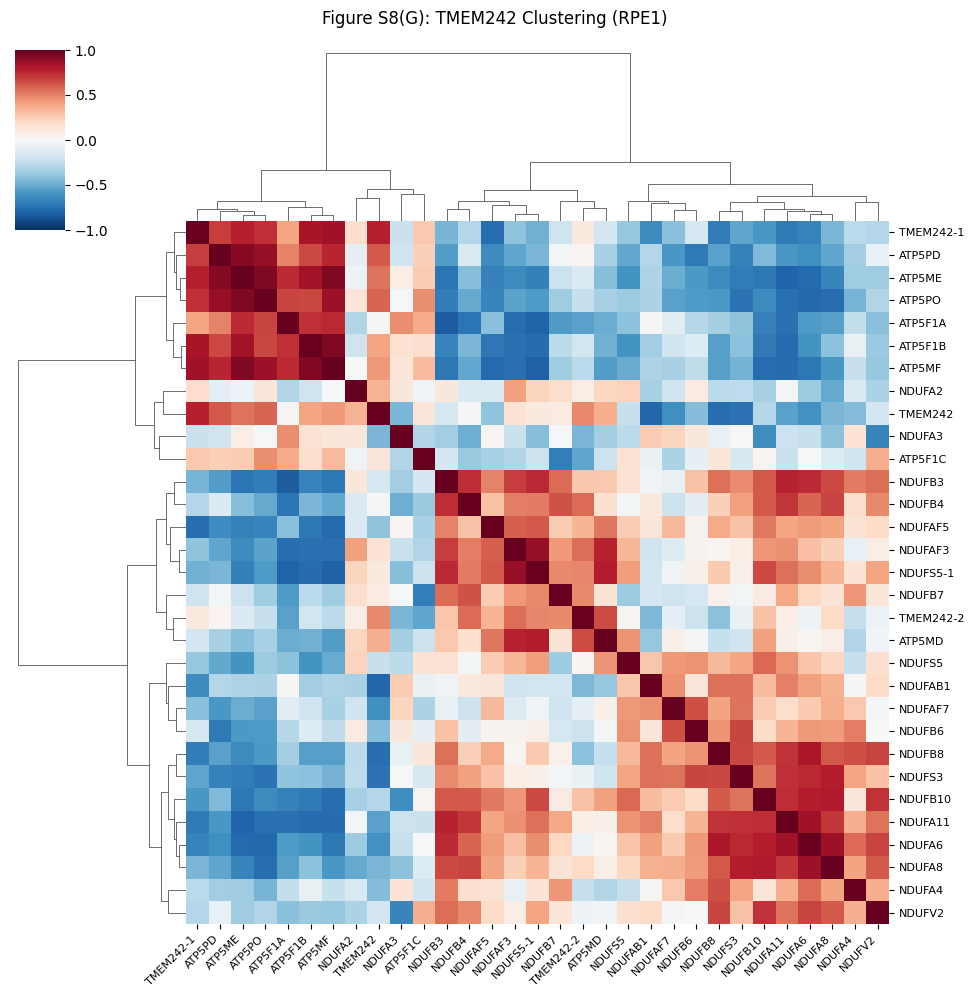

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore

# 1. 定义基因映射
id_map = {
    'ENSG00000198888':'MT-ND1', 'ENSG00000198763':'MT-ND2', 'ENSG00000198804':'MT-COX1', 
    'ENSG00000198712':'MT-COX2', 'ENSG00000228253':'MT-ATP8', 'ENSG00000198899':'MT-ATP6', 
    'ENSG00000198938':'MT-COX3', 'ENSG00000198840':'MT-ND3', 'ENSG00000212907':'MT-ND4L', 
    'ENSG00000198886':'MT-ND4', 'ENSG00000198786':'MT-ND5', 'ENSG00000198695':'MT-ND6', 
    'ENSG00000198727':'MT-CYB'
}

# 2. 筛选样本 (行) & 基因 (列)
# ------------------------------------------------
# 搜索目标样本 (TMEM242, Complex V, Complex I)
target_rows = [n for n in adata.obs_names if any(k in n for k in ['TMEM242', 'ATP5', 'NDU'])]
# 搜索目标基因 (只取存在的)
target_cols = [c for c in id_map.keys() if c in adata.var_names]

print(f"S8(G): 找到 {len(target_rows)} 个样本 (含 {sum('TMEM242' in r for r in target_rows)} 个 TMEM242)。")

if len(target_rows) > 0 and len(target_cols) > 0:
    # 3. 提取数据 & 预处理
    # ------------------------------------------------
    # 提取 -> 转名 -> Z-score
    subset = adata[target_rows, target_cols].to_df()
    subset.columns = [id_map[c] for c in subset.columns]
    subset_z = subset.apply(zscore, axis=0).fillna(0) # 按基因标准化

    # 4. 绘图 (Clustermap)
    # ------------------------------------------------
    plt.figure(figsize=(10, 10))
    g = sns.clustermap(subset_z.T.corr(), 
                       method='ward', metric='euclidean', cmap='RdBu_r', 
                       center=0, vmin=-1, vmax=1,
                       row_cluster=True, col_cluster=True,
                       xticklabels=True, yticklabels=True, 
                       figsize=(10, 10))

    # 调整字体
    plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45, ha='right', fontsize=8)
    plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=8)
    g.fig.suptitle("Figure S8(G): TMEM242 Clustering (RPE1)", y=1.02)
    plt.show()
else:
    print("❌ 未找到 TMEM242 或线粒体基因，无法绘图。")